In [8]:
import cv2
import numpy as np
# import matplotlib.pyplot as plt
import os

# Folder containing the psoriasis images
dataset_folder = r'D:\Downloads-D\Bala.Ai\datasets\Psoriasis'

# List to store file paths of all images in the folder
image_paths = [os.path.join(dataset_folder, f) for f in os.listdir(dataset_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]


In [39]:
def contrast_enhancement(image):
    """Enhance contrast using CLAHE."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    return clahe.apply(gray)

def apply_clahe(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    hsv[:, :, 2] = clahe.apply(hsv[:, :, 2])
    enhanced_image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return enhanced_image

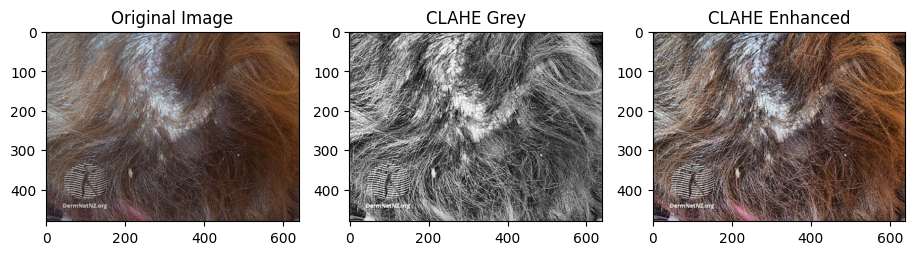

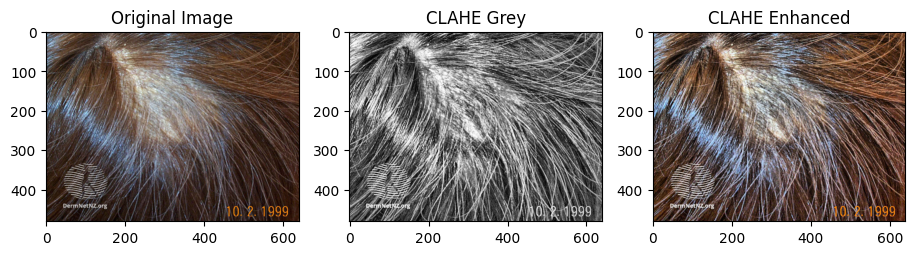

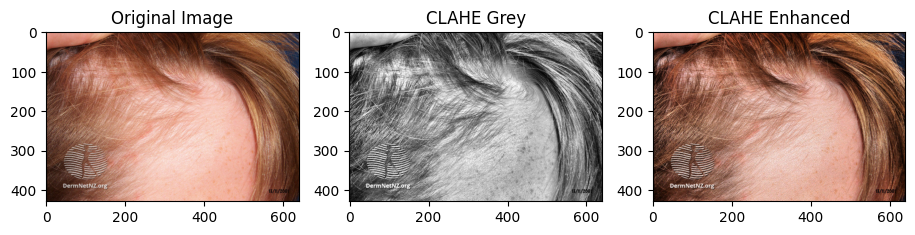

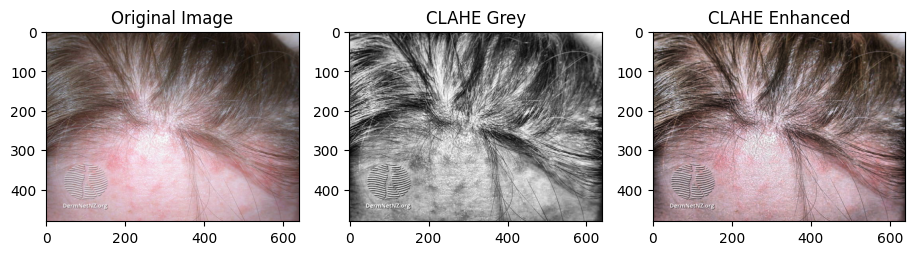

In [42]:
import matplotlib.pyplot as plt
for image_path in image_paths[:4]:  # Get only the first 4 images
    image = cv2.imread(image_path)
    
    if image is None:
        print(f"Error reading image {image_path}")
        continue
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply preprocessing techniques
    clahe_image = apply_clahe(image)
    enhanced_image = contrast_enhancement(image)

    # Visualize the original and processed images
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 4, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(2, 4, 2)
    plt.imshow(enhanced_image, cmap='gray')
    plt.title('CLAHE Grey')
    plt.axis('off')
    

    plt.subplot(2, 4, 3)
    plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB))
    plt.title('CLAHE Enhanced')
    plt.axis('off')
    

In [31]:
def apply_watershed_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    sure_bg = cv2.dilate(binary, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(image, markers)
    image[markers == -1] = [255, 0, 0]
    return image

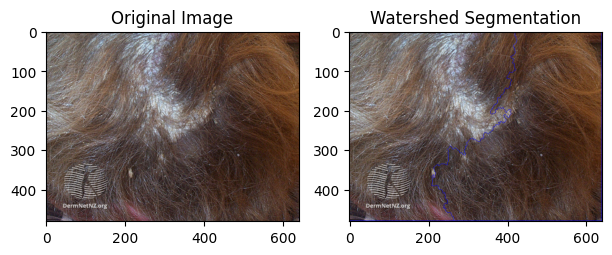

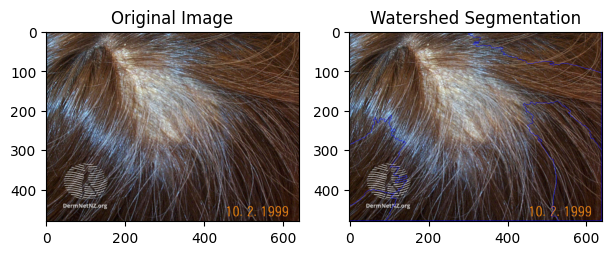

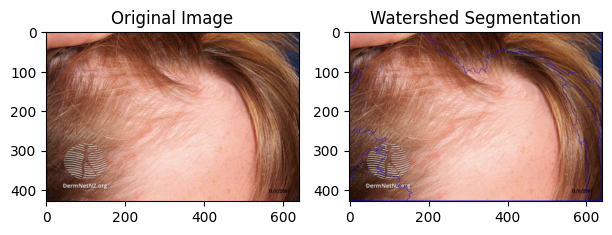

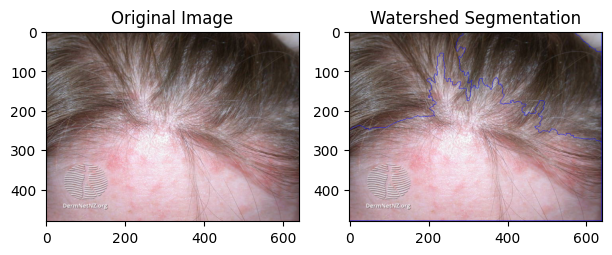

In [36]:
import matplotlib.pyplot as plt
for image_path in image_paths[:4]:  # Get only the first 4 images
    image = cv2.imread(image_path)
    
    if image is None:
        print(f"Error reading image {image_path}")
        continue
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    watershed_image = apply_watershed_segmentation(image.copy())
   

    # Visualize the original and processed images
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 4, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    
    plt.subplot(2, 4, 2)
    plt.imshow(cv2.cvtColor(watershed_image, cv2.COLOR_BGR2RGB))
    plt.title('Watershed Segmentation')
    

In [32]:
# Function to apply unsharp masking
def unsharp_mask(image, sigma=1.0, strength=1.5):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian Blur
    blurred = cv2.GaussianBlur(gray, (0, 0), sigma)
    # Calculate the sharpened image using unsharp masking formula
    sharpened = cv2.addWeighted(gray, 1.0 + strength, blurred, -strength, 0)
    return sharpened

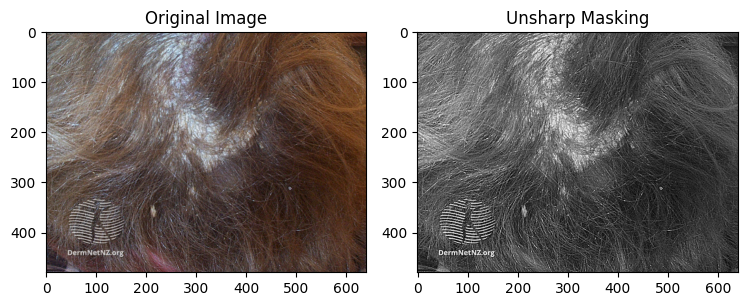

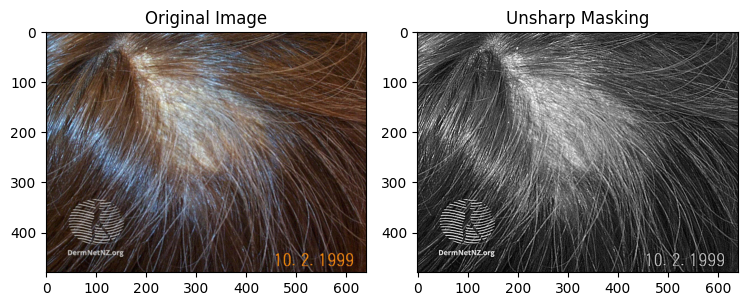

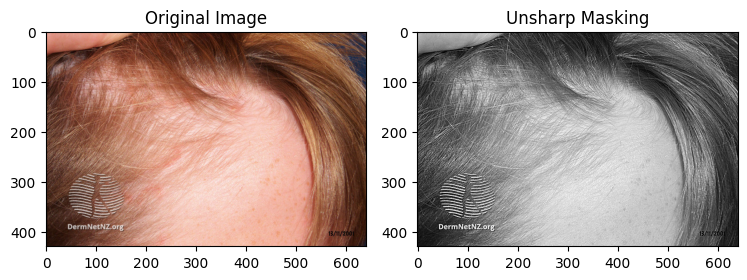

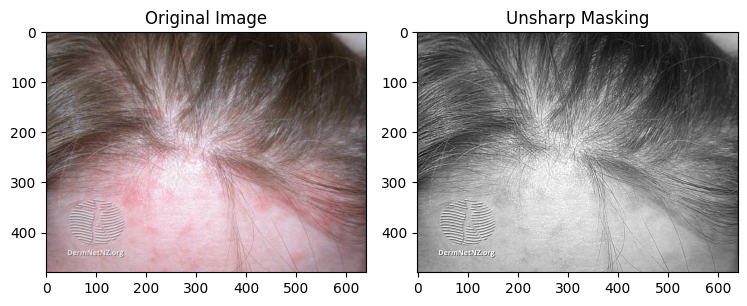

In [38]:
import matplotlib.pyplot as plt
for image_path in image_paths[:4]:  # Get only the first 4 images
    image = cv2.imread(image_path)
    
    if image is None:
        print(f"Error reading image {image_path}")
        continue
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply preprocessing techniques
    unmask_image = unsharp_mask(image)

    # Visualize the original and processed images
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 4, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    

    
    plt.subplot(2, 4, 2)
    plt.imshow(cv2.cvtColor(unmask_image, cv2.COLOR_BGR2RGB))
    plt.title('Unsharp Masking')
    
    plt.tight_layout()
    plt.show()
    plt.close()  # Close the current figure to free memory

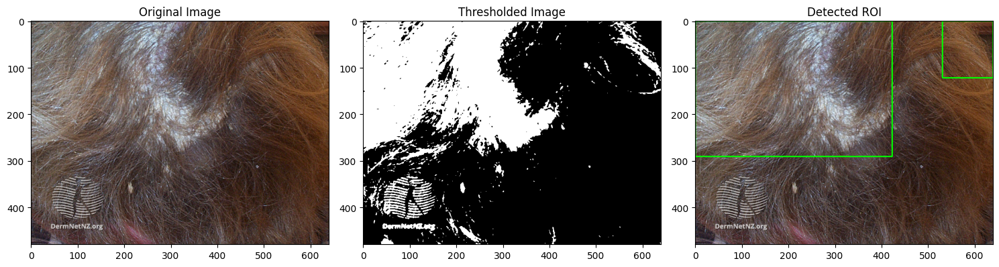

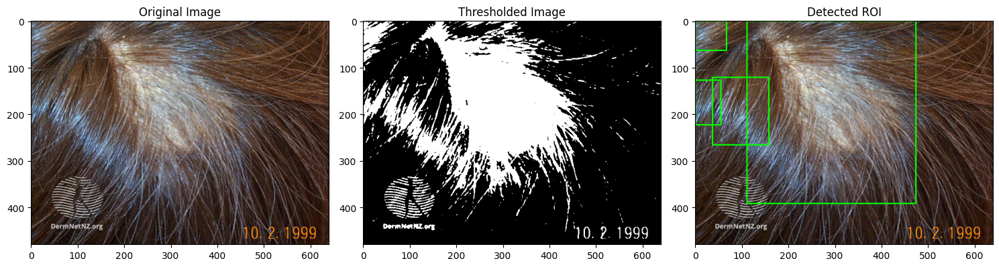

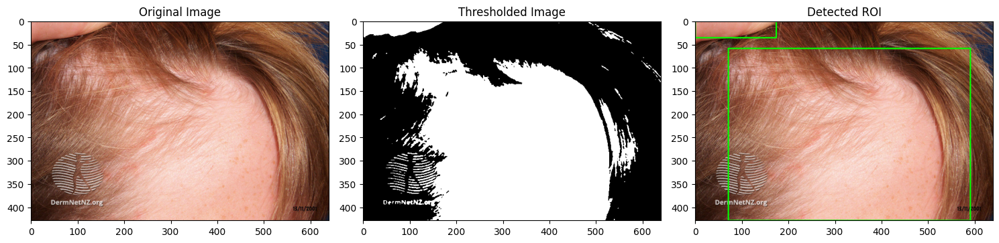

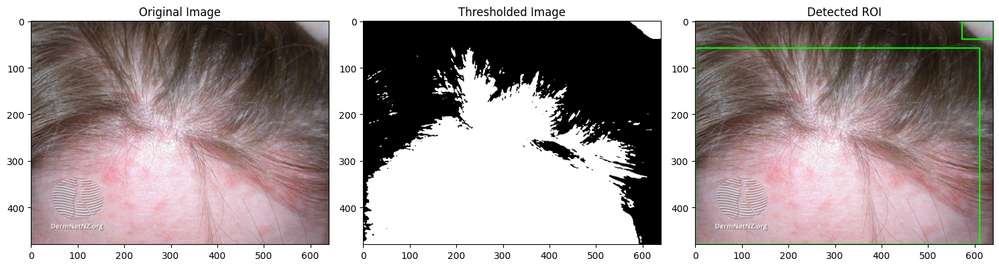

In [47]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Folder containing the psoriasis hair images dataset
dataset_folder = 'D:\\Downloads-D\\Bala.Ai\\datasets\\Psoriasis'

# Function to load images from the dataset folder
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            images.append(img)
    return images

# Function to find and visualize the region of interest (ROI)
def find_and_visualize_roi(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur to reduce noise and smooth the image
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply Otsu's Thresholding to segment the image
    _, thresholded = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the original image to visualize ROI
    roi_image = image.copy()

    # Draw contours and bounding boxes around detected regions
    for contour in contours:
        # Compute the bounding box for the contour
        x, y, w, h = cv2.boundingRect(contour)
        
        # Filter small regions based on area if needed
        if cv2.contourArea(contour) > 1000:  # Adjust this threshold according to your needs
            # Draw the bounding box on the image
            cv2.rectangle(roi_image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Display the original, thresholded, and ROI images side by side
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Thresholded Image')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(roi_image, cv2.COLOR_BGR2RGB))
    plt.title('Detected ROI')

    plt.tight_layout()
    plt.show()

# Load the dataset images
images = load_images_from_folder(dataset_folder)

# Apply ROI detection and visualization for each image
for i, image in enumerate(images[:4]):
    find_and_visualize_roi(image)


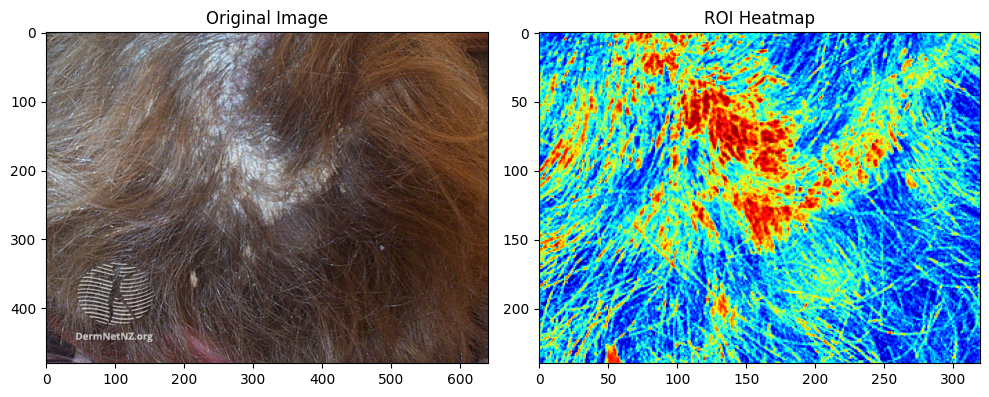

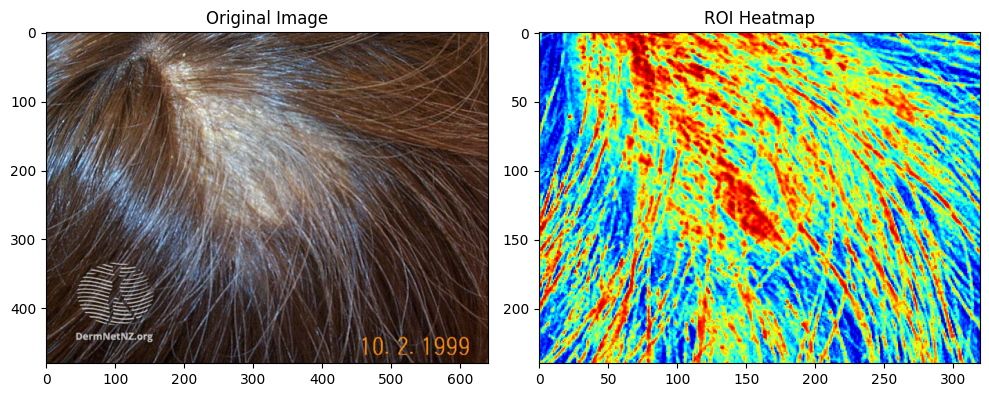

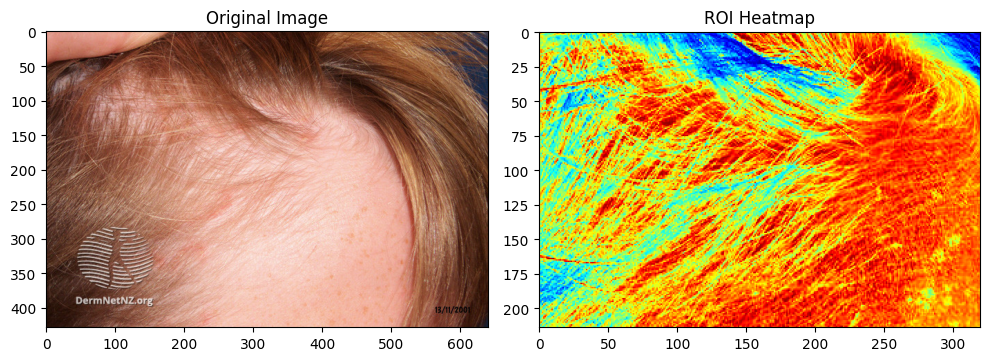

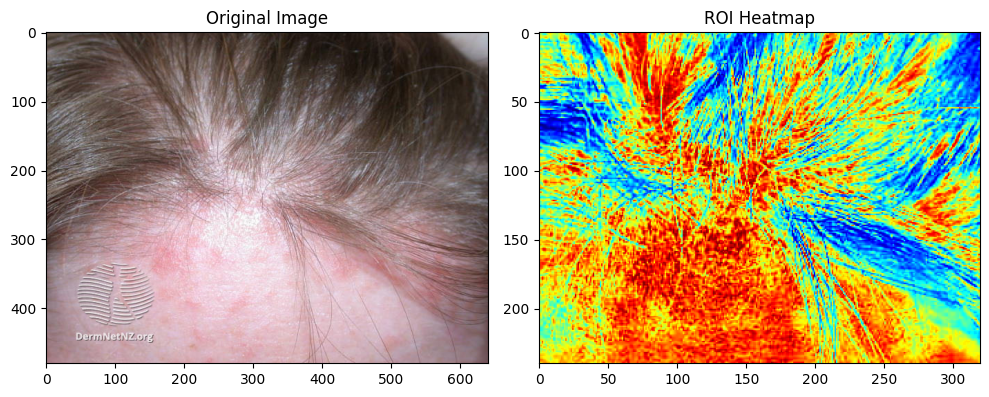

In [55]:

# Preprocessing function to apply CLAHE and edge detection
def preprocess_image(image):
    # Convert to Grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE to enhance contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(gray_image)

    # Edge Detection using Canny
    edges = cv2.Canny(clahe_image, 30, 100)

    return edges, clahe_image

dataset_folder = r'D:\Downloads-D\Bala.Ai\datasets\Psoriasis'

# Load the images from the dataset
images = load_images_from_folder(dataset_folder)

# Loop through each image, preprocess it, and display the results
for i, image in enumerate(images):
    edges, clahe_image = preprocess_image(image)

    # Displaying the results for the first few images as an example
    if i < 4:  # Change this to display more/less images
        plt.figure(figsize=(10, 5))

        # Edge Detection
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')

        # Define Region of Interest (ROI) - Center portion of the image
        height, width = clahe_image.shape
        x_start, x_end = int(width * 0.25), int(width * 0.75)
        y_start, y_end = int(height * 0.25), int(height * 0.75)
        roi = clahe_image[y_start:y_end, x_start:x_end]

        # Normalize ROI values for heatmap visualization
        normalized_roi = cv2.normalize(roi, None, 0, 255, cv2.NORM_MINMAX)

        # Apply a heatmap color map to visualize ROI
        heatmap = cv2.applyColorMap(normalized_roi.astype(np.uint8), cv2.COLORMAP_JET)

        # Display the ROI heatmap
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB))
        plt.title('ROI Heatmap')
        

        plt.tight_layout()
        plt.show()
